<a href="https://colab.research.google.com/github/LleilaA13/Thesis-MUL/blob/master/notebooks/inceptionv3/mask0_3/diversity.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##### Licensed under the Apache License, Version 2.0 (the "License");

In [ ]:
# Licensed under the Apache License, Version 2.0 (the "License");
# you may not use this file except in compliance with the License.
# You may obtain a copy of the License at
#
# https://www.apache.org/licenses/LICENSE-2.0
#
# Unless required by applicable law or agreed to in writing, software
# distributed under the License is distributed on an "AS IS" BASIS,
# WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
# See the License for the specific language governing permissions and
# limitations under the License.

# The Diversity Objective

This notebook demonstrates the diversity objective, which is used to generate multiple different visualizations from a single neuron or channel.

## Install, Import, Load Model

In [1]:
!pip install --quiet git+https://github.com/greentfrapp/lucent.git

  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 29.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 251.6/251.6 kB 21.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.6/1.6 MB 67.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.8/2.8 MB 83.7 MB/s eta 0:00:00


In [9]:
import torch
from torchvision import models
import matplotlib.pyplot as plt
import torchvision.transforms as T
from lucent.modelzoo.util import get_model_layers
from lucent.optvis import render, param, transform, objectives


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:

def load_inceptionv3(path):
    # 1000 classes for ImageNet by default
    model = models.inception_v3(num_classes=1000, aux_logits=False)
    checkpoint = torch.load(path, map_location='cpu', weights_only=False)

    try:
        model.load_state_dict(checkpoint['state_dict'], strict=False)
    except:
        model.load_state_dict(checkpoint, strict=False)

    model.eval()
    return model

# Example usage
original_model = load_inceptionv3("/content/drive/MyDrive/THESIS/InceptionV3_mask3/inceptionv3.pth")
unlearned_model = load_inceptionv3("/content/drive/MyDrive/THESIS/InceptionV3_mask3/RLcheckpoint.pth.tar")


## An Example

With the diversity objective, we have to submit a batch of images for optimization. The diversity objective then tries to maximize the difference in feature representations between the images in the batch.

Specifically, the objective penalizes cosine similarity between the feature representations.

In [12]:
from lucent.modelzoo.util import get_model_layers
print("Available layers in the original model:")
print(get_model_layers(original_model))

print("Available layers in the unlearned model:")
print(get_model_layers(unlearned_model))



Available layers in the original model:
['Conv2d_1a_3x3', 'Conv2d_1a_3x3_conv', 'Conv2d_1a_3x3_bn', 'Conv2d_2a_3x3', 'Conv2d_2a_3x3_conv', 'Conv2d_2a_3x3_bn', 'Conv2d_2b_3x3', 'Conv2d_2b_3x3_conv', 'Conv2d_2b_3x3_bn', 'maxpool1', 'Conv2d_3b_1x1', 'Conv2d_3b_1x1_conv', 'Conv2d_3b_1x1_bn', 'Conv2d_4a_3x3', 'Conv2d_4a_3x3_conv', 'Conv2d_4a_3x3_bn', 'maxpool2', 'Mixed_5b', 'Mixed_5b_branch1x1', 'Mixed_5b_branch1x1_conv', 'Mixed_5b_branch1x1_bn', 'Mixed_5b_branch5x5_1', 'Mixed_5b_branch5x5_1_conv', 'Mixed_5b_branch5x5_1_bn', 'Mixed_5b_branch5x5_2', 'Mixed_5b_branch5x5_2_conv', 'Mixed_5b_branch5x5_2_bn', 'Mixed_5b_branch3x3dbl_1', 'Mixed_5b_branch3x3dbl_1_conv', 'Mixed_5b_branch3x3dbl_1_bn', 'Mixed_5b_branch3x3dbl_2', 'Mixed_5b_branch3x3dbl_2_conv', 'Mixed_5b_branch3x3dbl_2_bn', 'Mixed_5b_branch3x3dbl_3', 'Mixed_5b_branch3x3dbl_3_conv', 'Mixed_5b_branch3x3dbl_3_bn', 'Mixed_5b_branch_pool', 'Mixed_5b_branch_pool_conv', 'Mixed_5b_branch_pool_bn', 'Mixed_5c', 'Mixed_5c_branch1x1', 'Mixed_5c_bra

100%|██████████| 512/512 [00:26<00:00, 19.64it/s]



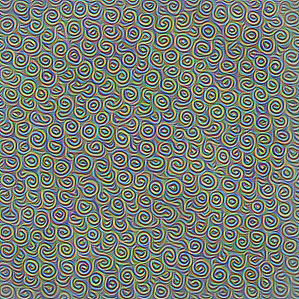
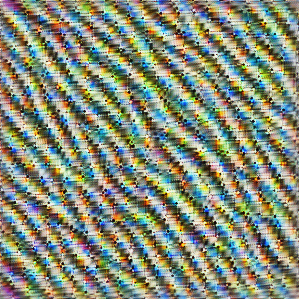
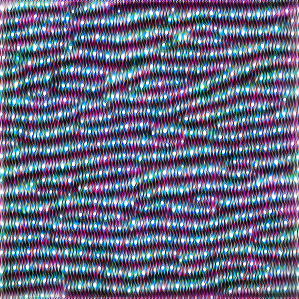
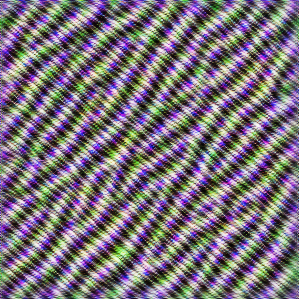

100%|██████████| 512/512 [00:25<00:00, 20.23it/s]



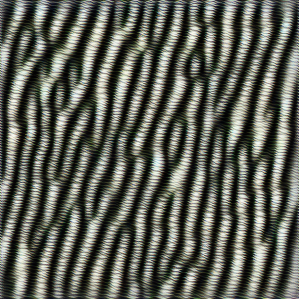
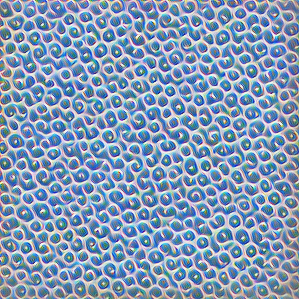
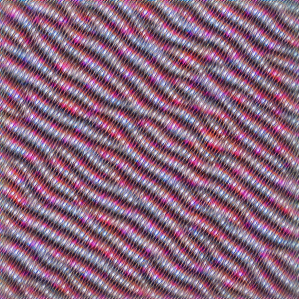
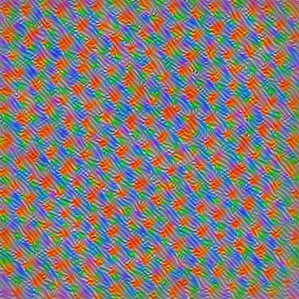

In [15]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
original_model.to(device).eval()
unlearned_model.to(device).eval()

batch_param_f = lambda: param.image(299, batch=4)

obj = objectives.channel("Mixed_5b", 9) - 1e2 * objectives.diversity("Mixed_5b")

_ = render.render_vis(original_model, obj, batch_param_f, show_inline=True)
_ = render.render_vis(unlearned_model, obj, batch_param_f, show_inline=True)

## More Examples

More examples reproducing results from the Distill article [Feature Visualization](https://distill.pub/2017/feature-visualization/).

Rendering visualization for layer: Mixed_6b, channel: 0
Original Model:


100%|██████████| 512/512 [00:37<00:00, 13.65it/s]



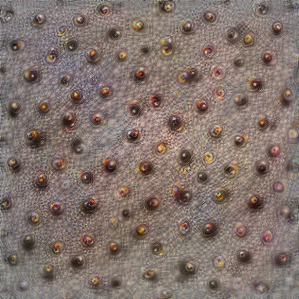
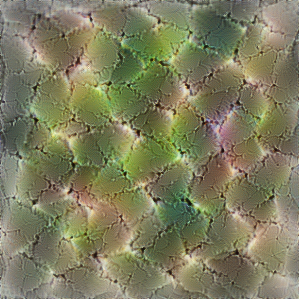
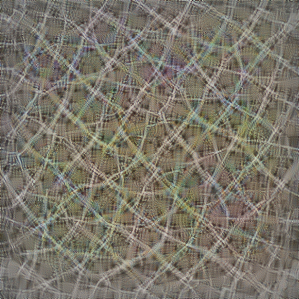
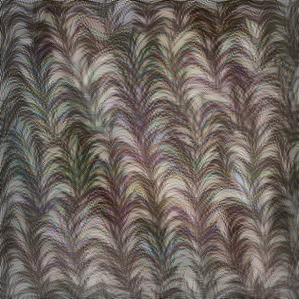

Unlearned Model:


100%|██████████| 512/512 [00:36<00:00, 14.06it/s]



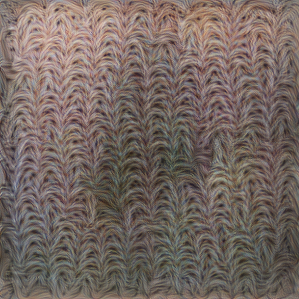
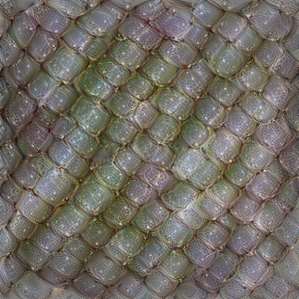
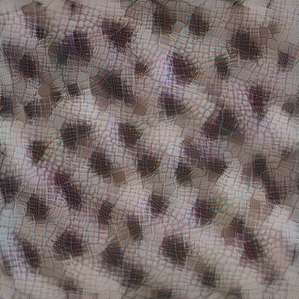
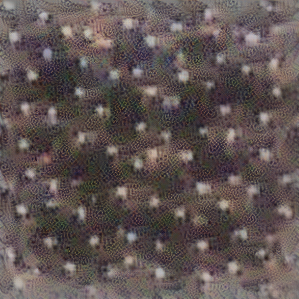

In [16]:
# Different curvy facets

# Using a valid InceptionV3 layer name, e.g., 'Mixed_6b_branch7x7_3_conv'
# The layer index (97) might not correspond to the same feature in InceptionV3.
# We'll use a placeholder index (e.g., 0) or keep the original if it works.
# Let's use Mixed_6b as it's a later mixed layer. Let's try channel 97 if it exists.
# Need to check if channel 97 exists in Mixed_6b. Let's use a more general layer like Mixed_6b.
# Checking get_model_layers output, Mixed_6b is a valid module. Let's try channel 0 for demonstration.
# A better approach is to find a layer that corresponds to textures or shapes.
# Let's use 'Mixed_6b' and channel 0 for now, as the original used 'mixed4a'.
layer_name = "Mixed_6b"
channel_index = 0 # Placeholder, may need adjustment based on desired feature

obj = objectives.channel(layer_name, channel_index) - 1e3 * objectives.diversity(layer_name) # here we use a higher weight on the diversity term

print(f"Rendering visualization for layer: {layer_name}, channel: {channel_index}")
print("Original Model:")
_ = render.render_vis(original_model, obj, batch_param_f, show_inline=True)
print("Unlearned Model:")
_ = render.render_vis(unlearned_model, obj, batch_param_f, show_inline=True)

Rendering visualization for layer: Mixed_6c, channel: 0
Original Model:


100%|██████████| 512/512 [00:39<00:00, 13.10it/s]



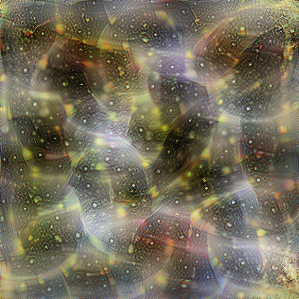
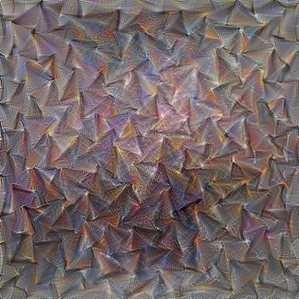
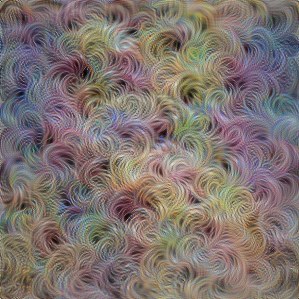
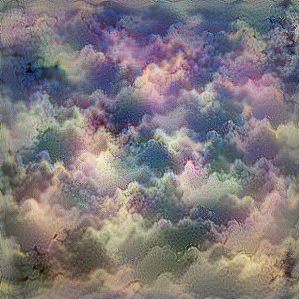

Unlearned Model:


100%|██████████| 512/512 [00:38<00:00, 13.13it/s]



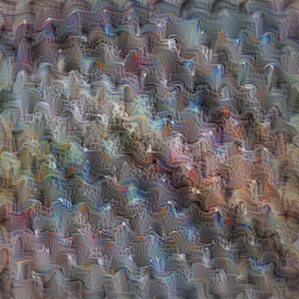
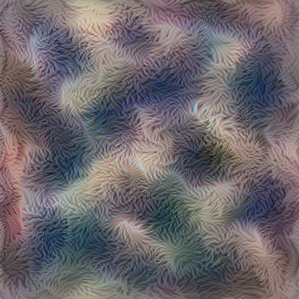
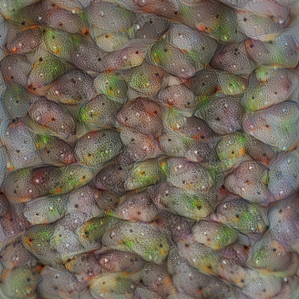
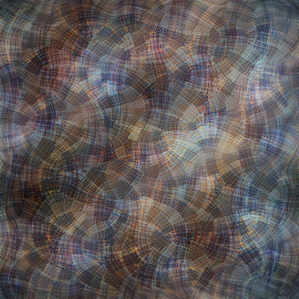

In [17]:
# Different shapes with the same fur texture

# Using a valid InceptionV3 layer name. Original used 'mixed4a', channel 143.
# Let's try 'Mixed_6c' as it's another mixed layer. Channel 143 might not exist or mean the same thing.
# Let's use channel 0 as a placeholder.
layer_name = "Mixed_6c"
channel_index = 0 # Placeholder, may need adjustment

obj = objectives.channel(layer_name, channel_index) - 1e2 * objectives.diversity(layer_name)

print(f"Rendering visualization for layer: {layer_name}, channel: {channel_index}")
print("Original Model:")
_ = render.render_vis(original_model, obj, batch_param_f, show_inline=True)
print("Unlearned Model:")
_ = render.render_vis(unlearned_model, obj, batch_param_f, show_inline=True)

Rendering visualization for layer: Mixed_7c_branch_pool_bn, channel: 26
Original Model:


100%|██████████| 512/512 [00:46<00:00, 10.99it/s]



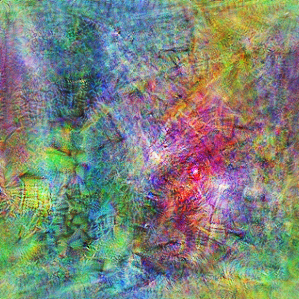
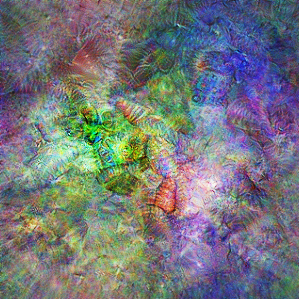
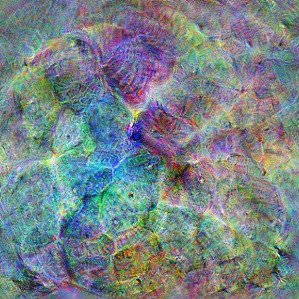
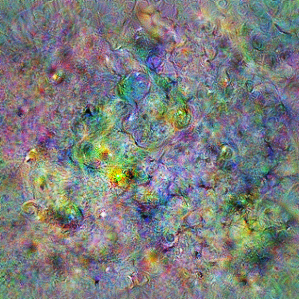

Unlearned Model:


100%|██████████| 512/512 [00:43<00:00, 11.67it/s]



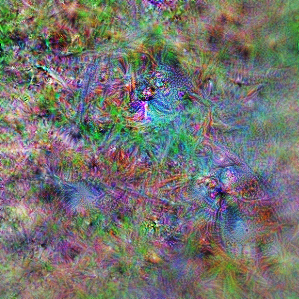
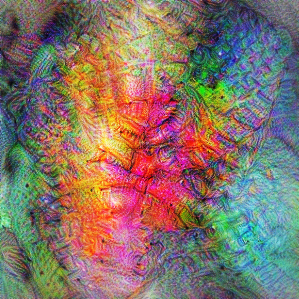
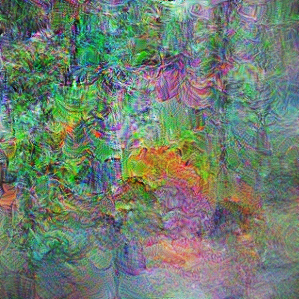
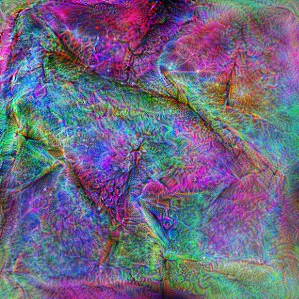

In [28]:
# Cars and Cats

# Original used 'mixed4e', channel 55. Let's try 'Mixed_6d' as a later mixed layer.
layer_name = "Mixed_7c_branch_pool_bn"
channel_index = 26 # Placeholder, may need adjustment

obj = objectives.channel(layer_name, channel_index) - 1e2 * objectives.diversity(layer_name)

print(f"Rendering visualization for layer: {layer_name}, channel: {channel_index}")
print("Original Model:")
_ = render.render_vis(original_model, obj, batch_param_f, show_inline=True)
print("Unlearned Model:")
_ = render.render_vis(unlearned_model, obj, batch_param_f, show_inline=True)



## Try it out!

Select your favorite channel or neuron or just pick a random one! Try adjusting the weight on the diversity term to see how that makes a difference!

Rendering visualization for layer: Mixed_6e, channel: 200
Original Model:


100%|██████████| 512/512 [00:44<00:00, 11.53it/s]



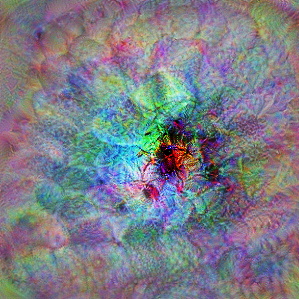
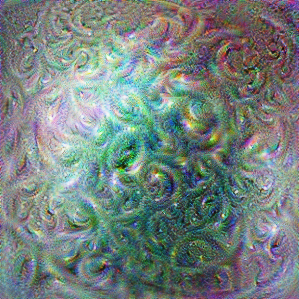
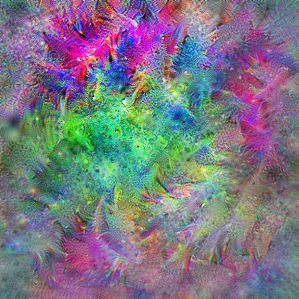
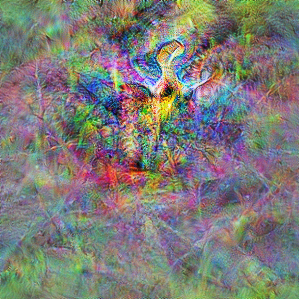

Unlearned Model:


100%|██████████| 512/512 [00:43<00:00, 11.79it/s]



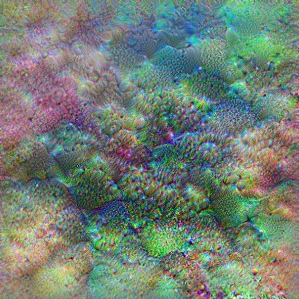
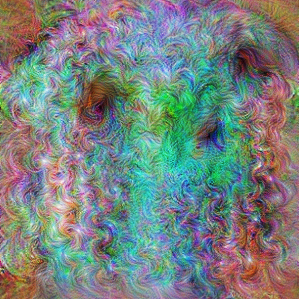
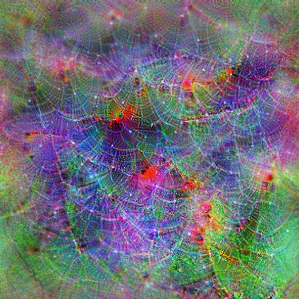
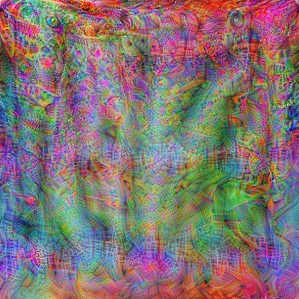

In [23]:
# Flowers and err... other stuff?

# Original used 'mixed4d_3x3_bottleneck_pre_relu_conv', channel 139.
# Let's try 'Mixed_6e' as a later mixed layer.
layer_name = "Mixed_6e"
channel_index = 200 # Placeholder, may need adjustment

batch_param_f = lambda: param.image(299, batch=4, decorrelate=False) # disable channel decorrelation for more trippy images

obj = objectives.channel(layer_name, channel_index) - 1e3 * objectives.diversity(layer_name)

print(f"Rendering visualization for layer: {layer_name}, channel: {channel_index}")
print("Original Model:")
_ = render.render_vis(original_model, obj, batch_param_f, show_inline=True)
print("Unlearned Model:")
_ = render.render_vis(unlearned_model, obj, batch_param_f, show_inline=True)